In [ ]:
!pip install pymc-marketing

In [1]:
import jax
print(jax.devices())

ERROR:2025-12-23 09:47:05,870:jax._src.xla_bridge:475: Jax plugin configuration error: Exception when calling jax_plugins.xla_cuda13.initialize()
Traceback (most recent call last):
  File "/root/PyMC-Marketing-Demo/.venv/lib/python3.12/site-packages/jax/_src/xla_bridge.py", line 473, in discover_pjrt_plugins
    plugin_module.initialize()
  File "/root/PyMC-Marketing-Demo/.venv/lib/python3.12/site-packages/jax_plugins/xla_cuda13/__init__.py", line 334, in initialize
    c_api = xb.register_plugin(
            ^^^^^^^^^^^^^^^^^^^
  File "/root/PyMC-Marketing-Demo/.venv/lib/python3.12/site-packages/jax/_src/xla_bridge.py", line 609, in register_plugin
    c_api = xla_client.load_pjrt_plugin_dynamically(plugin_name, library_path)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/root/PyMC-Marketing-Demo/.venv/lib/python3.12/site-packages/jaxlib/xla_client.py", line 117, in load_pjrt_plugin_dynamically
    return _xla.load_pjrt_plugin(plugin_name, libr

[CudaDevice(id=0)]


In [2]:
import jax
print(jax.local_devices()) 
# Should output something like [GpuDevice(id=0, process_index=0)]

[CpuDevice(id=0)]


In [ ]:
pip install numpyro

In [1]:
import pymc_marketing

print("pymc-marketing version:", pymc_marketing.__version__)

pymc-marketing version: 0.17.1


/root/PyMC-Marketing-Demo/.venv/lib/python3.12/site-packages/pymc_marketing/pytensor_utils.py:34: FutureWarning: `pytensor.graph.basic.ancestors` was moved to `pytensor.graph.traversal.ancestors`. Calling it from the old location will fail in a future release.
  from pytensor.graph.basic import ancestors


In [3]:

import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns
import xarray as xr
from pymc_extras.prior import Prior

from pymc_marketing.metrics import crps
from pymc_marketing.mmm import MMM, GeometricAdstock, LogisticSaturation
from pymc_marketing.mmm.utils import apply_sklearn_transformer_across_dim



warnings.filterwarnings("ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100


%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

/root/PyMC-Marketing-Demo/.venv/lib/python3.12/site-packages/pymc_marketing/pytensor_utils.py:34: FutureWarning: `pytensor.graph.basic.ancestors` was moved to `pytensor.graph.traversal.ancestors`. Calling it from the old location will fail in a future release.
  from pytensor.graph.basic import ancestors


## Read the data

In [3]:
import os
os.chdir("/root/PyMC-Marketing-Demo")
print(os.getcwd())

/root/PyMC-Marketing-Demo


In [4]:
df = pd.read_csv("data.csv")

In [4]:
df.head()

,time,conversions,revenue_per_conversion,Channel0_impression,Channel1_impression,Channel2_impression,Channel3_impression,Channel0_spend,Channel1_spend,Channel2_spend,Channel3_spend,competitor_activity_score_control,sentiment_score_control
0,2021-01-25,162516020,0.034943,13158922,11502933,10886062,20076642,146755.84,128646.98,121880.98,231813.16,-1.472066,-1.047554
1,2021-02-01,202669810,0.035010,11940023,19441896,26490828,25072962,133161.98,217435.08,296592.80,289502.72,-0.325011,-0.204449
2,2021-02-08,191953620,0.034959,15842855,17982754,6699681,16160443,176688.61,201116.27,75010.01,186595.11,-0.543921,-0.826044
3,2021-02-15,235994200,0.034971,15057842,9532758,13611908,21745476,167933.69,106612.85,152399.70,251082.19,-0.265067,-0.124859
4,2021-02-22,188125570,0.034980,27408934,22014372,19013050,16498701,305680.16,246205.23,212871.20,190500.78,-0.199531,-0.489119


In [5]:
# Dropping unneeded columns

df=df.drop(columns=['revenue_per_conversion','Channel0_impression','Channel1_impression','Channel2_impression','Channel3_impression'])

In [6]:
# Rename columns ending with '_spend' by removing the suffix
df = df.rename(columns={col: col.replace('_spend', '') for col in df.columns if col.endswith('_spend')})

In [ ]:
# df = df.rename(columns={"shop_income": "y", "week":"date","country":"geo"})

In [7]:
df.head()

,time,conversions,Channel0,Channel1,Channel2,Channel3,competitor_activity_score_control,sentiment_score_control
0,2021-01-25,162516020,146755.84,128646.98,121880.98,231813.16,-1.472066,-1.047554
1,2021-02-01,202669810,133161.98,217435.08,296592.80,289502.72,-0.325011,-0.204449
2,2021-02-08,191953620,176688.61,201116.27,75010.01,186595.11,-0.543921,-0.826044
3,2021-02-15,235994200,167933.69,106612.85,152399.70,251082.19,-0.265067,-0.124859
4,2021-02-22,188125570,305680.16,246205.23,212871.20,190500.78,-0.199531,-0.489119


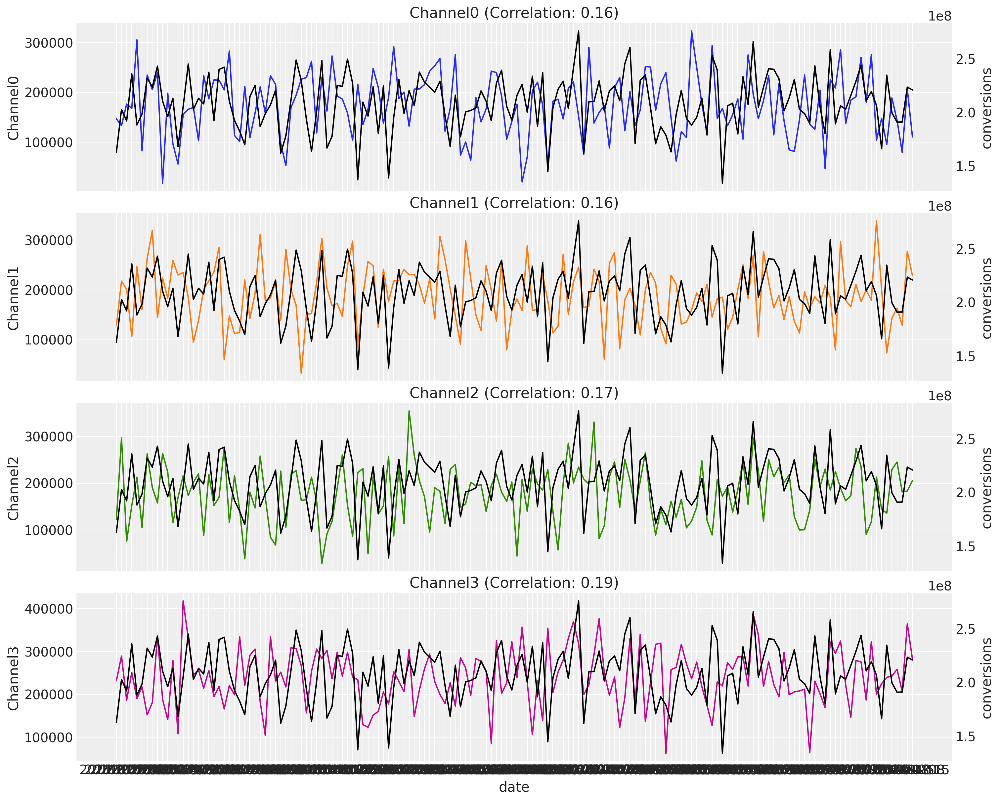

In [8]:
channels=[col for col in df.columns if col.startswith("Channel")]
n_channels = len(channels)
fig, axes = plt.subplots(
    nrows=n_channels,
    ncols=1,
    figsize=(15, 3 * n_channels),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, channel in enumerate(channels):
    ax = axes[i]
    ax_twin = ax.twinx()
    sns.lineplot(data=df, x="time", y=channel, color=f"C{i}", ax=ax)
    sns.lineplot(data=df, x="time", y="conversions", color="black", ax=ax_twin)
    correlation = df[[channel, "conversions"]].corr().iloc[0, 1]
    ax_twin.grid(None)
    ax.set(title=f"{channel} (Correlation: {correlation:.2f})")

ax.set_xlabel("date");

## Modeling

Test set starts from date: 2023-10-09 00:00:00


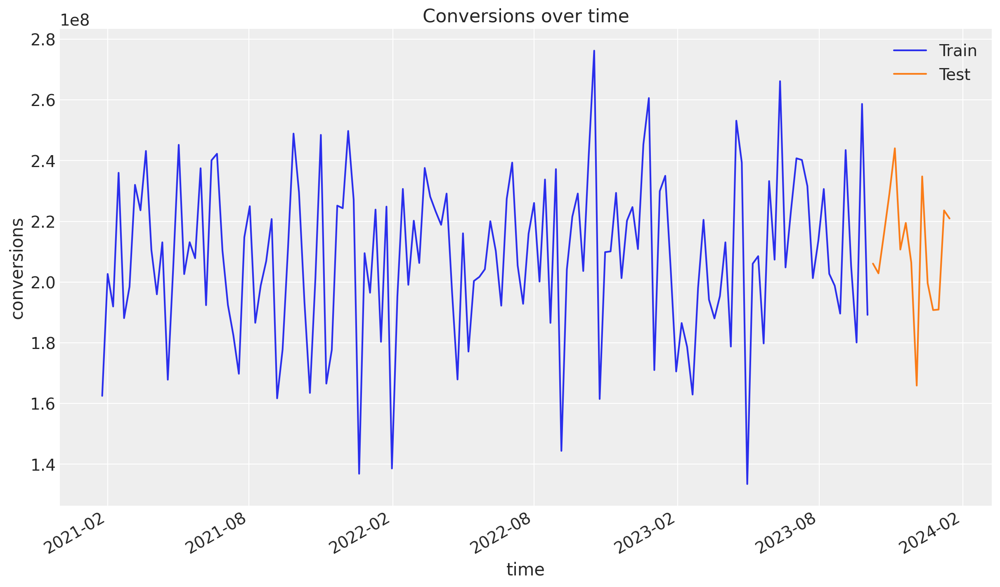

In [7]:
import matplotlib.dates as mdates

# Convert 'time' column to datetime
df["time"] = pd.to_datetime(df["time"])

# Calculate the split index for the last 10% of the dataframe
split_idx = int(len(df) * 0.9)
train_test_split_date = df.iloc[split_idx]["time"]

train_mask = df.time <= train_test_split_date
test_mask = df.time > train_test_split_date

train_df = df[train_mask]
test_df = df[test_mask]

print(f"Test set starts from date: {test_df['time'].iloc[0]}")

fig, ax = plt.subplots()
sns.lineplot(data=train_df, x="time", y="conversions", color="C0", label="Train", ax=ax)
sns.lineplot(data=test_df, x="time", y="conversions", color="C1", label="Test", ax=ax)

# Format x-axis for six-month intervals
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

fig.autofmt_xdate()
ax.set(title="Conversions over time", xlabel="time", ylabel="conversions");

In [8]:
X_train = train_df.drop(columns="conversions")
X_test = test_df.drop(columns="conversions")

y_train = train_df["conversions"]
y_test = test_df["conversions"]

In [9]:
channels=[col for col in df.columns if col.startswith("Channel")]
n_channels = len(channels)
controls = ["competitor_activity_score_control","sentiment_score_control"]

In [10]:
total_spend_per_channel=X_train[channels].sum(axis=0)

spend_share = total_spend_per_channel / total_spend_per_channel.sum()
spend_share

Channel0    0.223994
Channel1    0.241139
Channel2    0.227796
Channel3    0.307071
dtype: float64

In [11]:
prior_sigma =spend_share.to_numpy()
print(prior_sigma)

[0.2239935  0.24113894 0.22779624 0.30707132]


In [ ]:
# Set prior_sigma for Shopping (index 2), Microsoft (index 8), and Pinterest (index 9) to 0.01
# prior_sigma[[2, 8, 9]] = 0.01

In [12]:
my_model_config = {
    "intercept": Prior("HalfNormal", sigma=5),
    "saturation_beta": Prior("HalfNormal", sigma=prior_sigma,dims="channel"),
    "gamma_control": Prior("Normal", mu=0, sigma=0.05),
    "gamma_fourier": Prior("Laplace", mu=0, b=0.2),
    "likelihood": Prior("TruncatedNormal", sigma=Prior("HalfNormal", sigma=6)),
}

my_sampler_config = {"progressbar": True}

In [13]:
mmm = MMM(
    date_column="time",
    channel_columns=channels,
    control_columns=controls,
    adstock=GeometricAdstock(l_max=10),
    saturation=LogisticSaturation(),
    time_varying_intercept=False,
    yearly_seasonality=2,
    model_config=my_model_config,
    sampler_config=my_sampler_config,
)

In [14]:
mmm.default_model_config

{'intercept': Prior("Normal", mu=0, sigma=2),
 'likelihood': Prior("Normal", sigma=Prior("HalfNormal", sigma=2)),
 'gamma_control': Prior("Normal", mu=0, sigma=2, dims="control"),
 'gamma_fourier': Prior("Laplace", mu=0, b=1, dims="fourier_mode"),
 'adstock_alpha': Prior("Beta", alpha=1, beta=3, dims="channel"),
 'saturation_lam': Prior("Gamma", alpha=3, beta=1, dims="channel"),
 'saturation_beta': Prior("HalfNormal", sigma=[0.50974477 0.07367847 0.0117476  0.10643025 0.04658097 0.02307215
  0.06647866 0.14203466 0.01482602 0.00540645], dims="channel")}

In [13]:
mmm.model_config

{'intercept': Prior("HalfNormal", sigma=5),
 'likelihood': Prior("TruncatedNormal", sigma=Prior("HalfNormal", sigma=6), dims="date"),
 'gamma_control': Prior("Normal", mu=0, sigma=0.05, dims="control"),
 'gamma_fourier': Prior("Laplace", mu=0, b=0.2),
 'adstock_alpha': Prior("Beta", alpha=1, beta=3, dims="channel"),
 'saturation_lam': Prior("Gamma", alpha=3, beta=1, dims="channel"),
 'saturation_beta': Prior("HalfNormal", sigma=[0.49728545 0.08402681 0.10286331 0.0533288  0.02376035 0.06204508
  0.15416075 0.01652881 0.00600064], dims="channel")}

## Prior predictive checks

Sampling: [adstock_alpha, gamma_control, gamma_fourier, intercept, saturation_beta, saturation_lam, y, y_sigma]


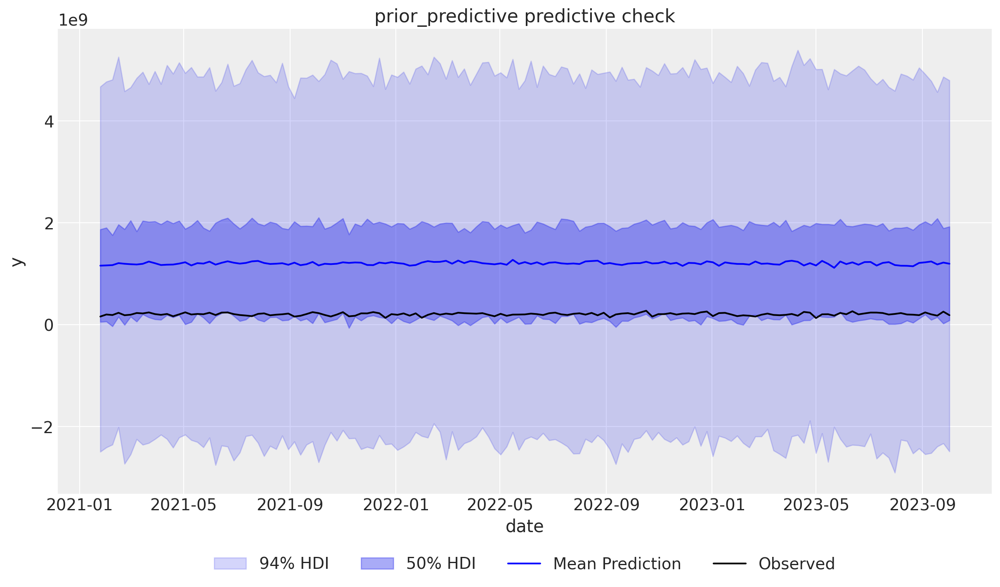

In [23]:
# Generate prior predictive samples
mmm.sample_prior_predictive(X_train, y_train, samples=4_000)
fig, ax = plt.subplots()
fig = mmm.plot_prior_predictive(original_scale=True, ax=ax)
ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.2), ncol=4)
ax.set(xlabel="date", ylabel="y");

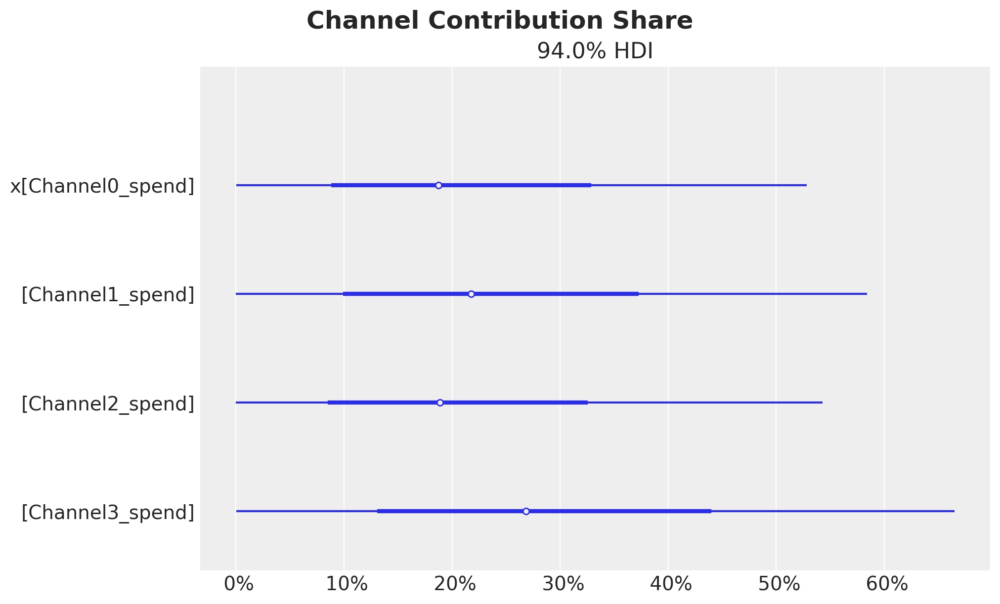

In [24]:
fig = mmm.plot_channel_contribution_share_hdi(prior=True, figsize=(10, 6))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold");

In [ ]:
# Define rng for reproducibility
rng = np.random.default_rng(123)

mmm.fit(
    X=X_train,
    y=y_train,
    chains=4,
    target_accept=0.975,
    random_seed=rng,
    nuts_sampler="numpyro"
)

In [15]:
mmm.idata.sample_stats.diverging.sum("draw")


<xarray.DataArray 'diverging' (chain: 4)> Size: 32B
array([0, 0, 0, 0])
Coordinates:
  * chain    (chain) int64 32B 0 1 2 3

In [47]:
mmm.idata

Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data
	> fit_data
	> posterior_predictive

In [21]:
az.summary(
    data=mmm.idata,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)["r_hat"].describe()

count    42.0
mean      1.0
std       0.0
min       1.0
25%       1.0
50%       1.0
75%       1.0
max       1.0
Name: r_hat, dtype: float64

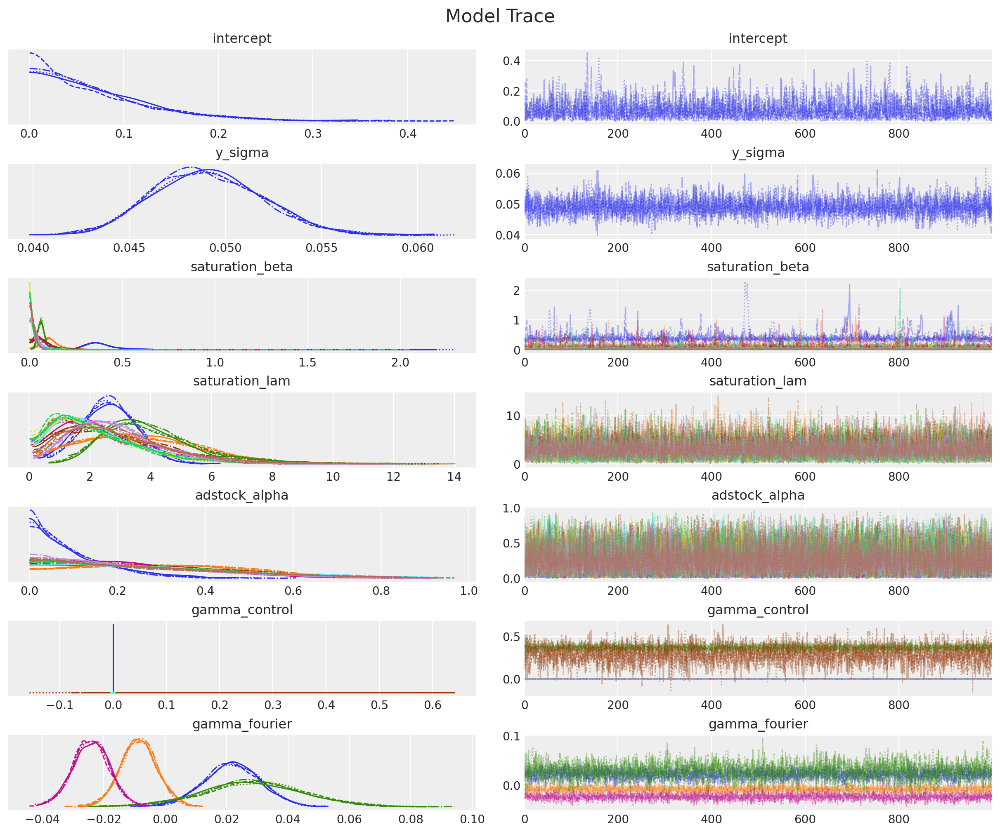

In [22]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16);

## Posterior Predictive Check

In [16]:
mmm.sample_posterior_predictive(X_train, extend_idata=True, combined=True)

Sampling: [y]


Output()

<xarray.Dataset> Size: 5MB
Dimensions:  (date: 141, sample: 4000)
Coordinates:
  * date     (date) datetime64[ns] 1kB 2021-01-25 2021-02-01 ... 2023-10-02
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 5MB 1.304e+08 1.439e+08 ... 2.395e+08
Attributes:
    created_at:                 2025-12-23T09:52:56.427118+00:00
    arviz_version:              0.23.0
    inference_library:          pymc
    inference_library_version:  5.27.0

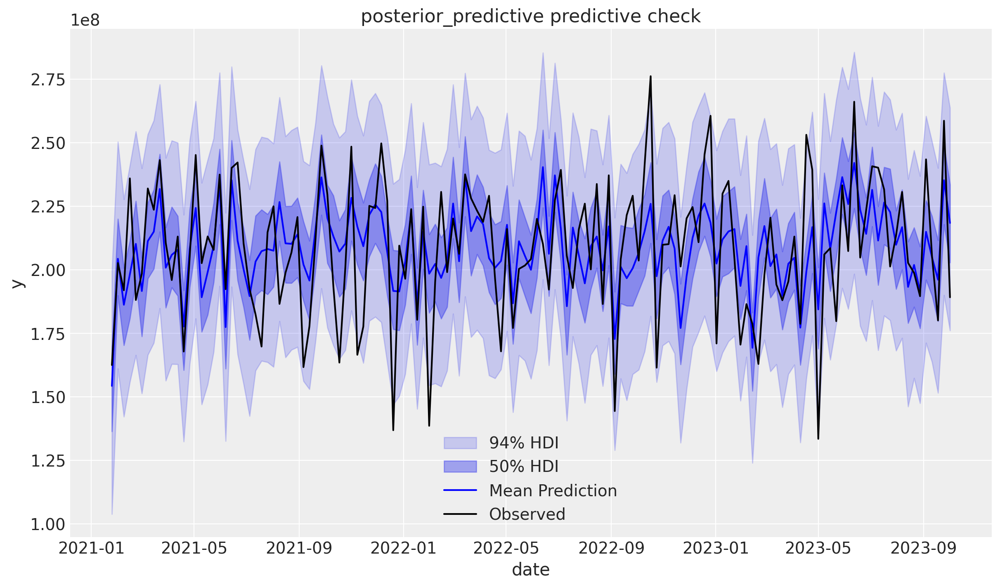

In [18]:
mmm.plot_posterior_predictive(original_scale=True);

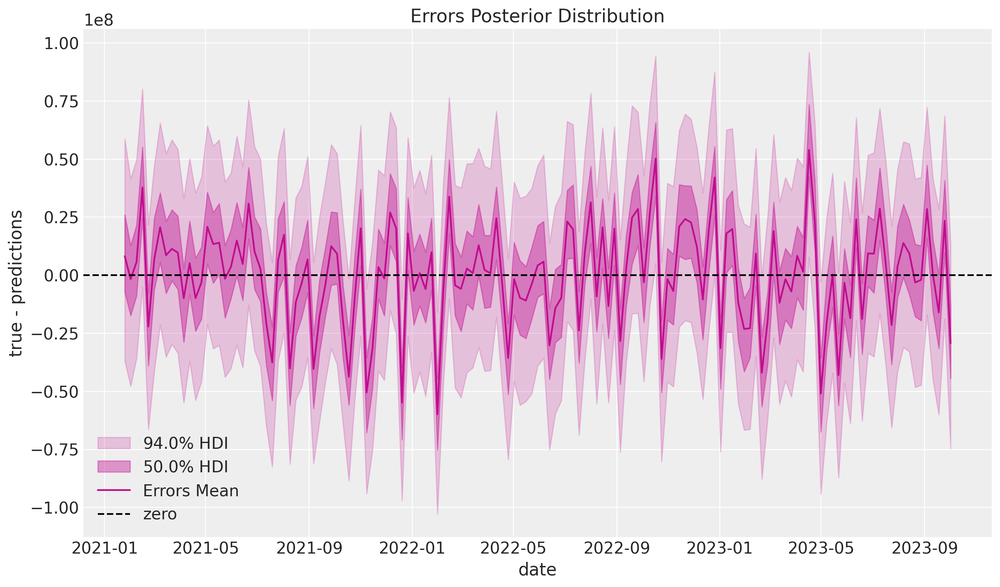

In [19]:
mmm.plot_errors(original_scale=True);

## Media deep dive

### Channel Contributions

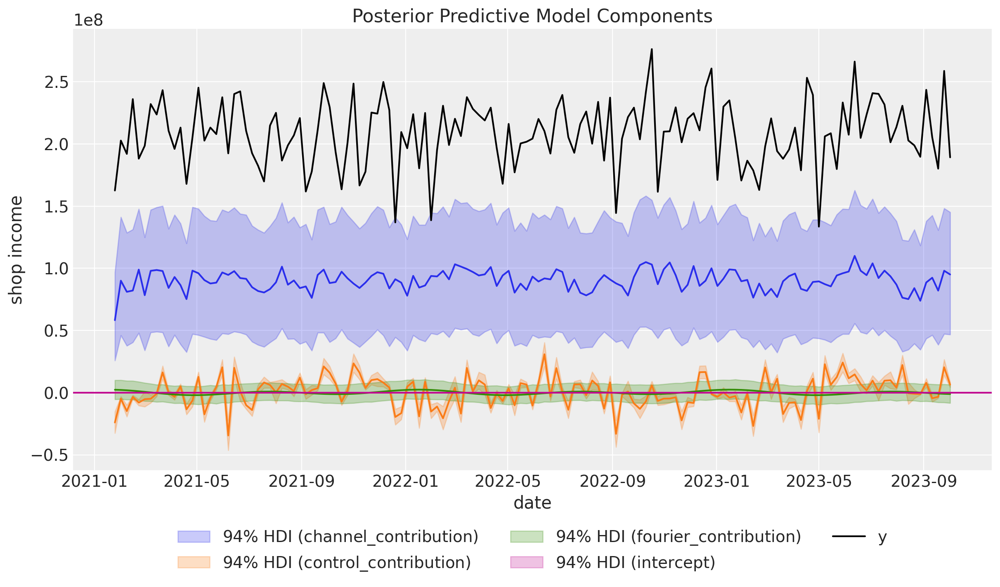

In [20]:
fig = mmm.plot_components_contributions(original_scale=True)
fig.gca().set(xlabel="date", ylabel="shop income");

/tmp/ipykernel_25892/3066869557.py:25: UserWarning: 
                Each contribution value must be either all positive or all negative.
                Try deselecting variables with negative contributions.
                
  fig = mmm.plot_grouped_contribution_breakdown_over_time(


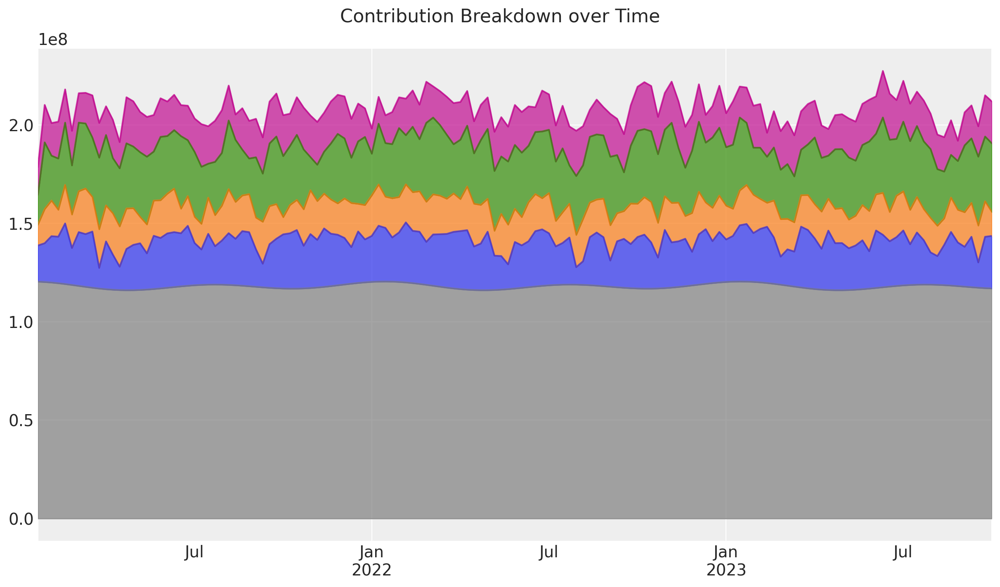

In [21]:
groups = {
    "Base": [
        "intercept",
        "yearly_seasonality",
    ],
    "Channel0": ["Channel0"],   # Update mapping if you know which channel is Google
    "Channel1": ["Channel1"],   # Update mapping if you know which channel is Meta
    "Channel2": ["Channel2"],   # Update mapping if you know which channel is TV
    "Channel3": ["Channel3"],   # Update mapping if you know which channel is Other
    "Controls": controls,
}

area_kwargs = {
    "color": {
        "Channel0": "royalblue",
        "Channel1": "crimson",
        "Channel2": "goldenrod",
        "Channel3": "mediumseagreen",
        "Base": "gray",
        "Controls": "slateblue",
    },
    "alpha": 0.6,
}

fig = mmm.plot_grouped_contribution_breakdown_over_time(
    stack_groups=groups,
    original_scale=True,
    area_kwargs={
        "color": {
            "Channel0": "C0",
            "Channel1": "C1",
            "Channel2": "C2",
            "Channel3": "C3",
            "Base": "gray",
            "Controls": "C4",
        },
        "alpha": 0.7,
    },
)

fig.suptitle("Contribution Breakdown over Time", fontsize=16);

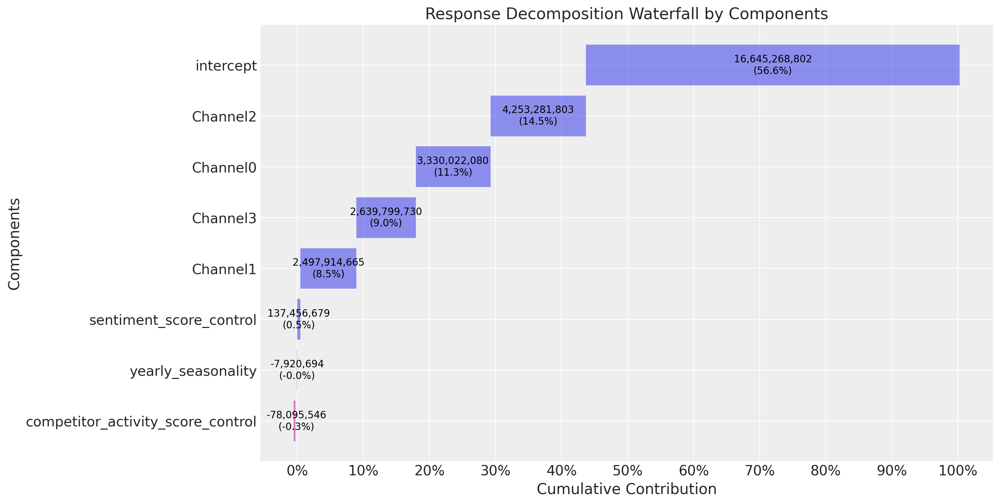

In [22]:
mmm.plot_waterfall_components_decomposition();

### Saturation curves

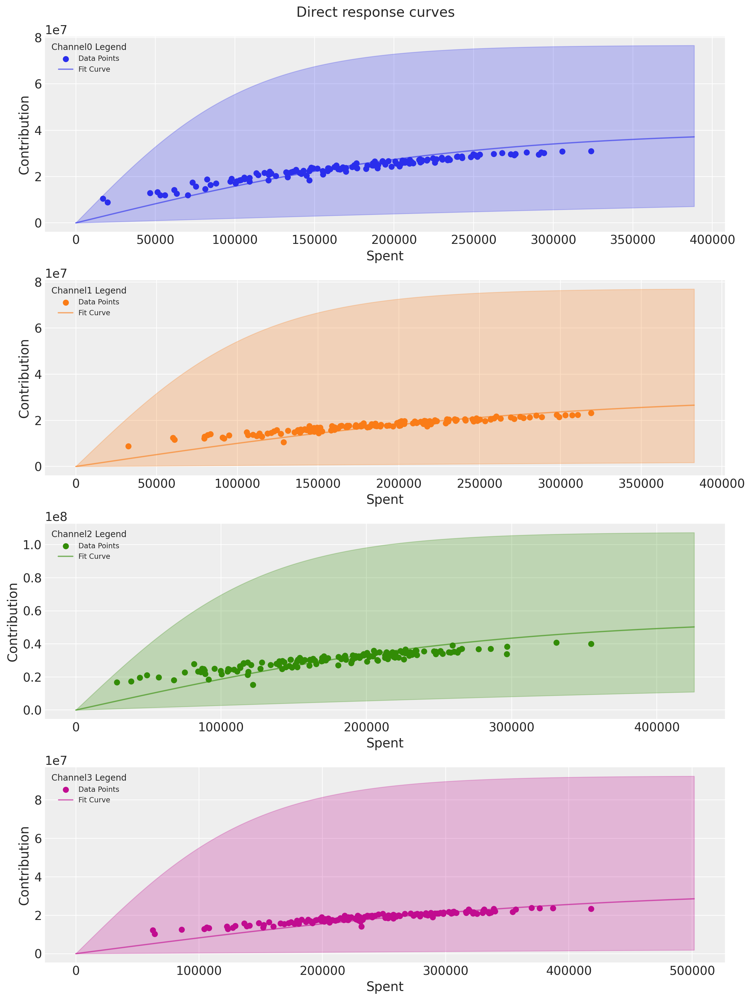

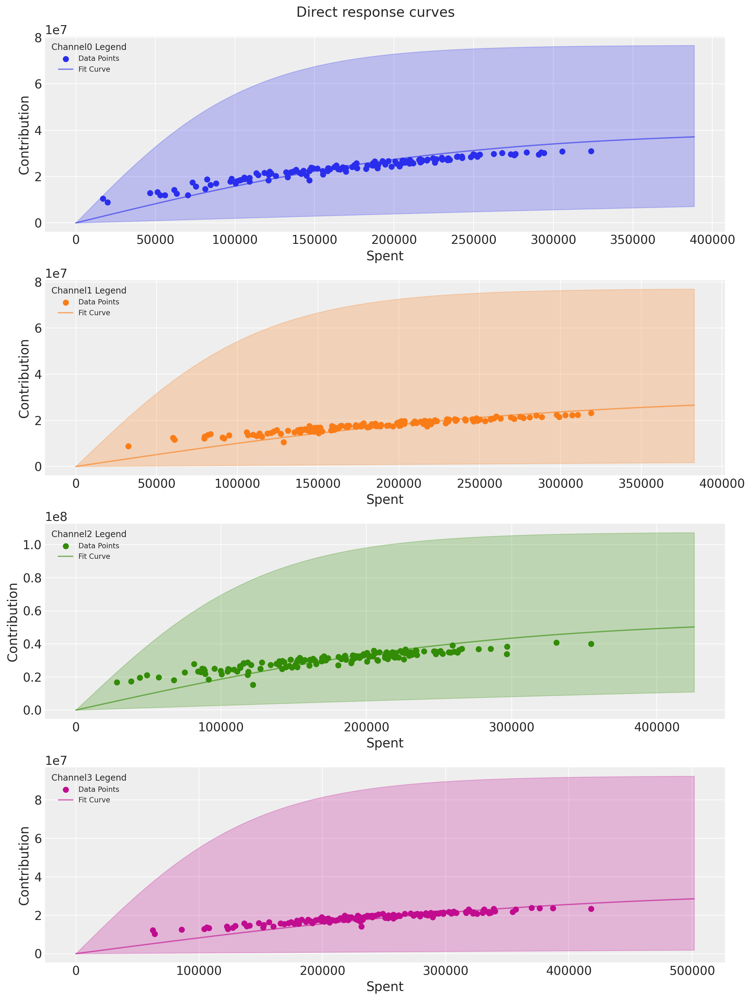

In [23]:
mmm.plot_direct_contribution_curves(
	show_fit=True,
	xlim_max=1.2,  # xlim_max should be int, not float
)

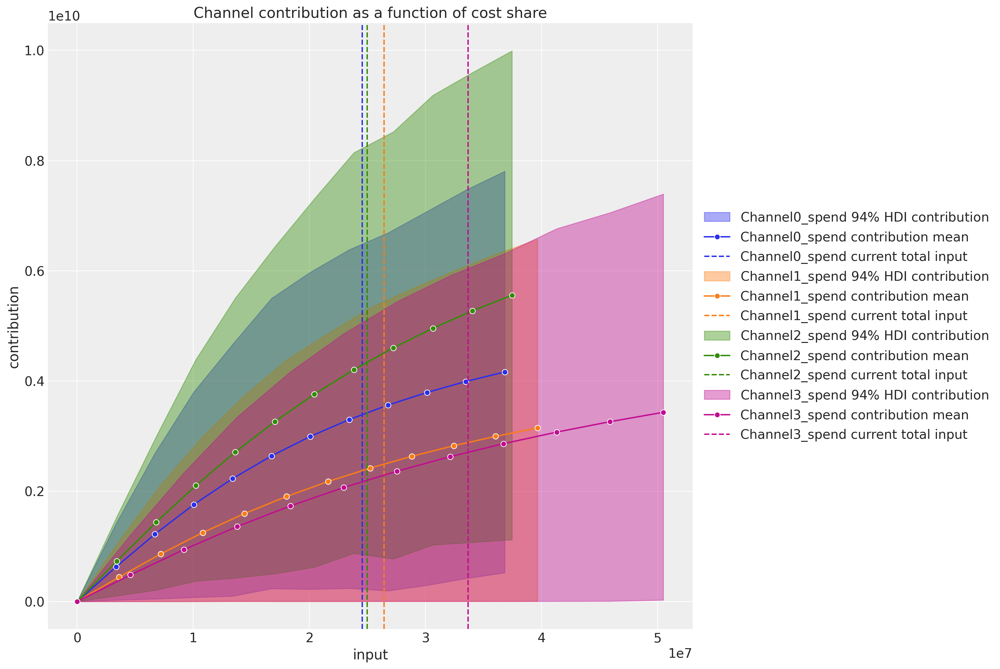

In [35]:
mmm.plot_channel_contribution_grid(start=0, stop=1.5, num=12, absolute_xrange=True, figsize=(15, 10));


### ROAS

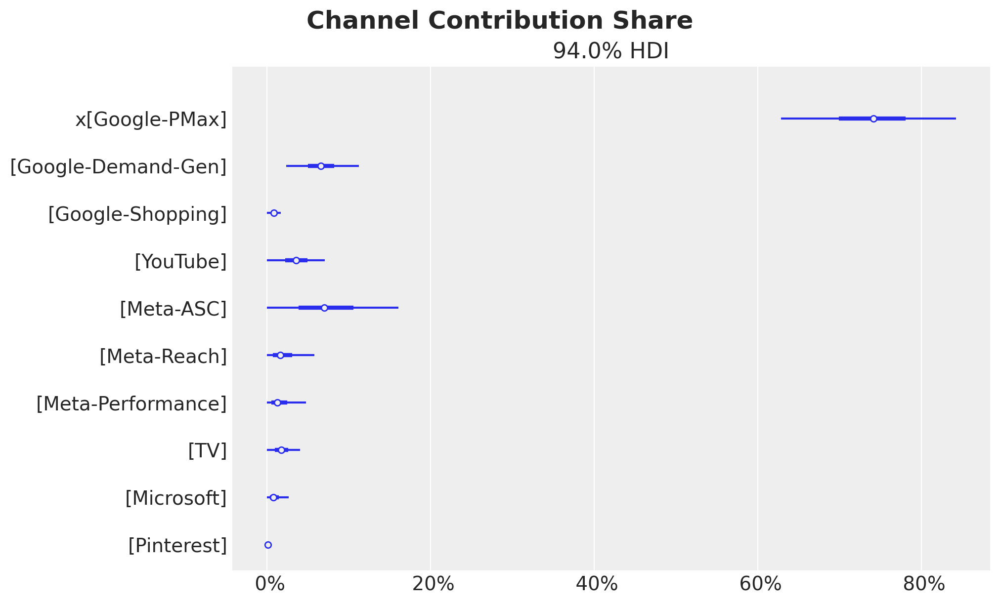

In [144]:
fig = mmm.plot_channel_contribution_share_hdi(figsize=(10, 6))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold");

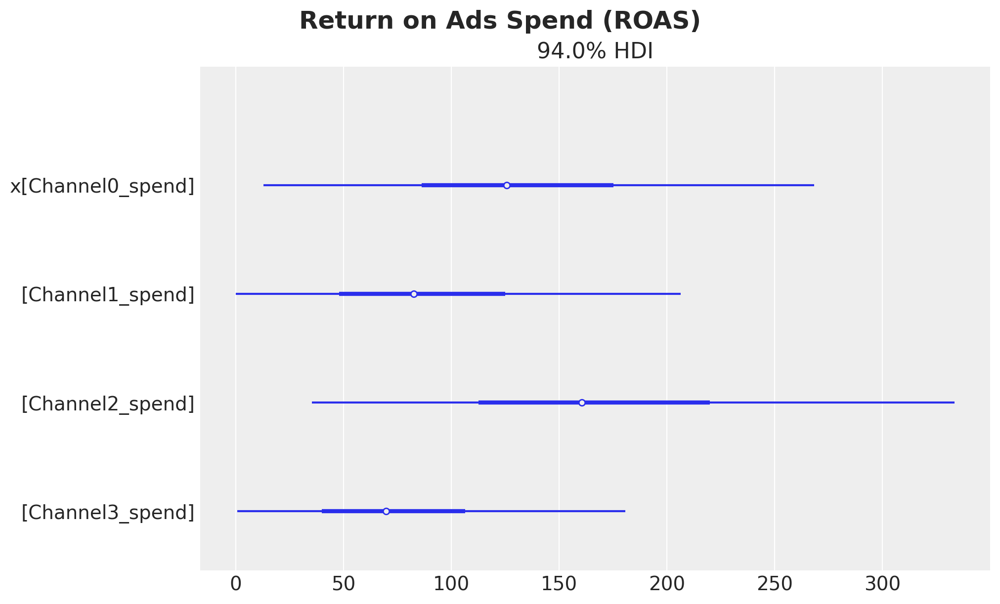

In [36]:
# Get the channel contributions on the original scale
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

# Sum the contributions over the whole training period
spend_sum = X_train[channels].sum().to_numpy()
spend_sum = spend_sum[
    np.newaxis, np.newaxis, :
]  # We need these extra dimensions to broadcast the spend sum to the shape of the contributions.

# Compute the ROAS as the ratio of the mean contribution and the spend for each channel
roas_samples = channel_contribution_original_scale.sum(dim="date") / spend_sum

# Plot the ROAS
fig, ax = plt.subplots(figsize=(10, 6))
az.plot_forest(roas_samples, combined=True, ax=ax)
fig.suptitle("Return on Ads Spend (ROAS)", fontsize=18, fontweight="bold");

/tmp/ipykernel_25892/712674997.py:22: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


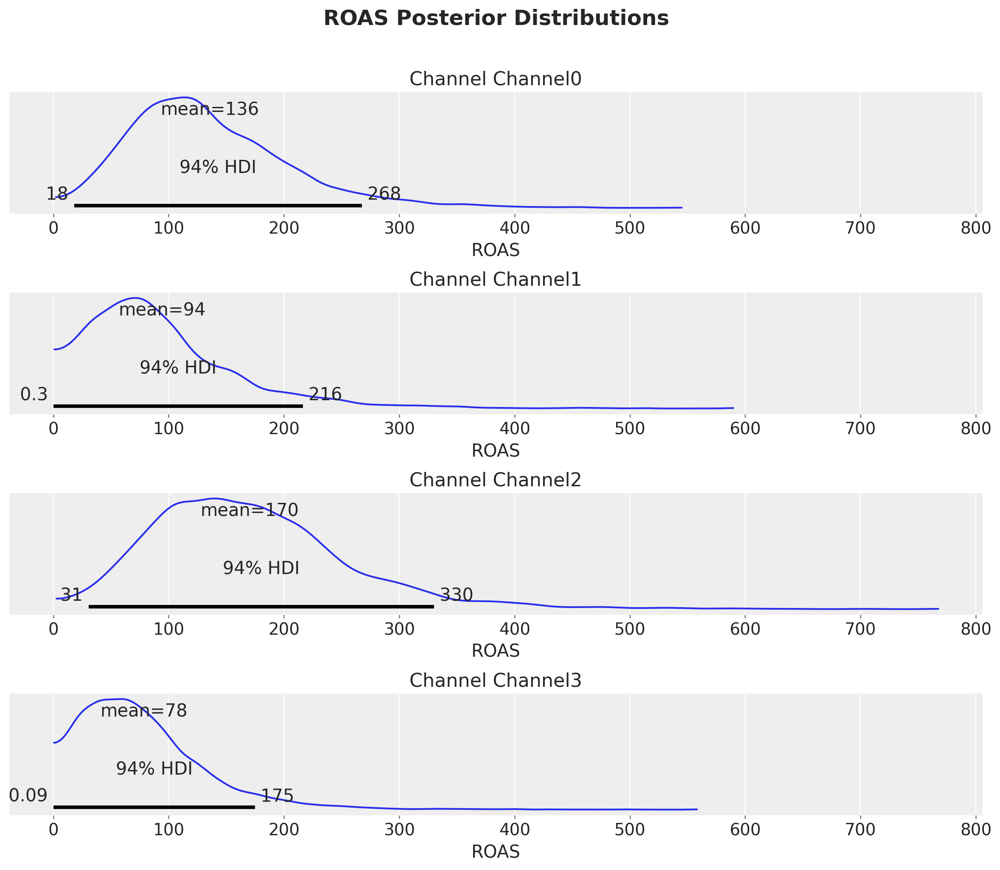

In [24]:
# Compute channel contribution in original scale
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

# Calculate total spend per channel for the geo present in your data
spend_sum = X_train[channels].sum().to_numpy()

# Calculate ROAS samples: sum contributions over dates, divide by total spend per channel
roas_samples = (
    channel_contribution_original_scale.sum(dim="date")
    / spend_sum
)

fig, axes = plt.subplots(
    nrows=len(channels), ncols=1, figsize=(12, 2.5 * len(channels)), sharex=True, layout="constrained"
)

for i, channel in enumerate(channels):
    az.plot_posterior(roas_samples.sel(channel=channel), ax=axes[i])
    axes[i].set(title=f"Channel {channel}", xlabel="ROAS")

fig.suptitle("ROAS Posterior Distributions", fontsize=18, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

In [25]:
# Calculate ROAS mean for each channel using roas_samples
roas_means = {channel: roas_samples.sel(channel=channel).mean().item() for channel in channels}
print(roas_means)

{'Channel0': 135.62034806435338, 'Channel1': 94.49817227781475, 'Channel2': 170.32984704274028, 'Channel3': 78.42325929280543}


/tmp/ipykernel_9606/2680588045.py:50: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


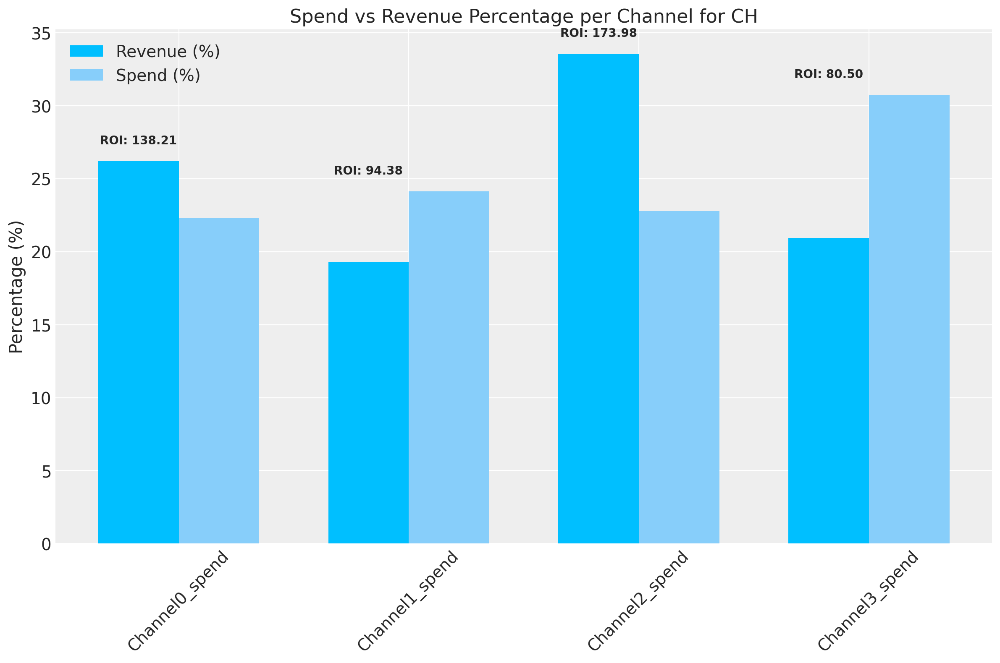

In [41]:
import numpy as np
import matplotlib.pyplot as plt


# Get spends and contributions for each channel for the selected geo in the specified order
spends = [df[channel].sum() for channel in channels]
contributions = [
    mmm.idata["posterior"]["channel_contribution_original_scale"]
    .sel(channel=channel)
    .mean(dim=["chain", "draw"])
    .sum()
    .item()
    for channel in channels
]

# Calculate percentages
total_spend = np.sum(spends)
total_contribution = np.sum(contributions)
spend_percent = [s / total_spend * 100 if total_spend > 0 else 0 for s in spends]
contribution_percent = [c / total_contribution * 100 if total_contribution > 0 else 0 for c in contributions]
# Compute mean ROAS for each channel
roas_means = {channel: roas_samples.sel(channel=channel).mean().item() for channel in channels}
roas_vals = [roas_means[channel] for channel in channels]

x = np.arange(len(channels))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 8))
bars1 = ax.bar(x - width/2, contribution_percent, width, label='Revenue (%)', color='deepskyblue')
bars2 = ax.bar(x + width/2, spend_percent, width, label='Spend (%)', color='lightskyblue')

# Annotate ROAS on top of each channel
for i, (bar1, bar2, roas_val) in enumerate(zip(bars1, bars2, roas_vals)):
    max_height = max(bar1.get_height(), bar2.get_height())
    ax.text(
        bar1.get_x() + bar1.get_width()/2,
        max_height + 1,
        f'ROI: {roas_val:.2f}',
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

ax.set_xticks(x)
ax.set_xticklabels(channels, rotation=45)
ax.set_ylabel('Percentage (%)')
ax.set_title(f'Spend vs Revenue Percentage per Channel for {geo}')
ax.legend()
plt.tight_layout()
plt.show()

/tmp/ipykernel_9606/2510552348.py:36: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


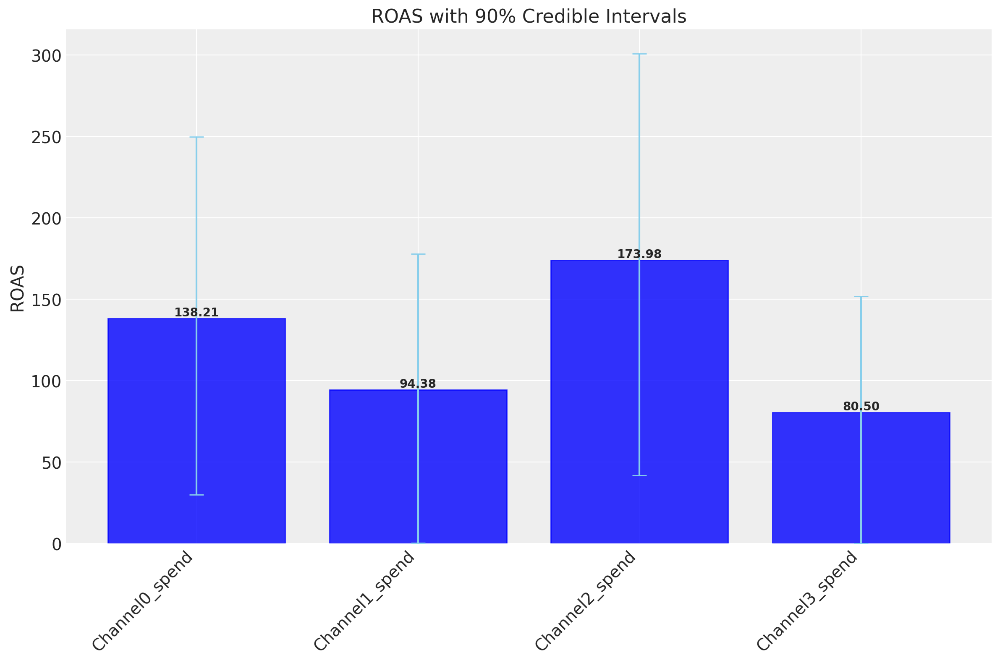

In [45]:
# Define the desired channel order
channels = [
    "Channel0_spend", "Channel1_spend", "Channel2_spend", "Channel3_spend"
]

# Reorder ROAS means and HDIs according to channels
roas_means_ordered = np.array([roas_means[ch] for ch in channels])
roas_hdi_ordered = np.array([az.hdi(roas_samples.sel(channel=ch), hdi_prob=0.90)["x"].to_numpy() for ch in channels])

# Error bars: lower and upper
yerr_lower = np.maximum(roas_means_ordered - roas_hdi_ordered[:, 0], 0)
yerr_upper = np.maximum(roas_hdi_ordered[:, 1] - roas_means_ordered, 0)
yerr = np.vstack([yerr_lower, yerr_upper])

x_pos = np.arange(len(channels))
fig, ax = plt.subplots(figsize=(12,8 ))
bars = ax.bar(x_pos, roas_means_ordered, yerr=yerr,
              capsize=6, color="blue", edgecolor="blue", alpha=0.8, ecolor="skyblue")

# Annotate ROAS mean on top of each bar
for i, bar in enumerate(bars):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{roas_means_ordered[i]:.2f}",
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold"
    )

ax.set_xticks(x_pos)
ax.set_xticklabels(channels, rotation=45, ha="right")
ax.set_ylabel("ROAS")
ax.set_title("ROAS with 90% Credible Intervals")
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import r2_score
from sklearn.preprocessing import MaxAbsScaler

def mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    y_true = y_true[mask]
    y_pred = y_pred[mask]
    if len(y_true) == 0:
        return np.nan
    return np.mean(np.abs((y_true - y_pred) / y_true))

# Get the mean of the posterior predictive for each date
y_pred = (
    mmm.idata["posterior_predictive"]["y"]
    .mean(dim=["chain", "draw"])
    .to_dataframe()
    .reset_index()
)

# Rename 'date' to 'time' to match df for merging
y_pred = y_pred.rename(columns={"date": "time"})

# Merge predictions with actuals
df_eval = df.merge(
    y_pred,
    on="time",
    how="inner"
)

actual = df_eval["conversions"]
pred = df_eval["y"]

# Use scaled actuals for metrics
r2 = r2_score(actual, pred)
mape = mape(actual, pred)

metrics_df = pd.DataFrame([{"MAPE": mape, "R2": r2}])
print(metrics_df)


       MAPE        R2
0  0.084237  0.358182


In [32]:
df_eval.head()

,time,conversions,Channel0,Channel1,Channel2,Channel3,competitor_activity_score_control,sentiment_score_control,y
0,2021-01-25,162516020,146755.84,128646.98,121880.98,231813.16,-1.472066,-1.047554,1.543028e+08
1,2021-02-01,202669810,133161.98,217435.08,296592.80,289502.72,-0.325011,-0.204449,2.043381e+08
2,2021-02-08,191953620,176688.61,201116.27,75010.01,186595.11,-0.543921,-0.826044,1.862489e+08
3,2021-02-15,235994200,167933.69,106612.85,152399.70,251082.19,-0.265067,-0.124859,1.982244e+08
4,2021-02-22,188125570,305680.16,246205.23,212871.20,190500.78,-0.199531,-0.489119,2.102079e+08


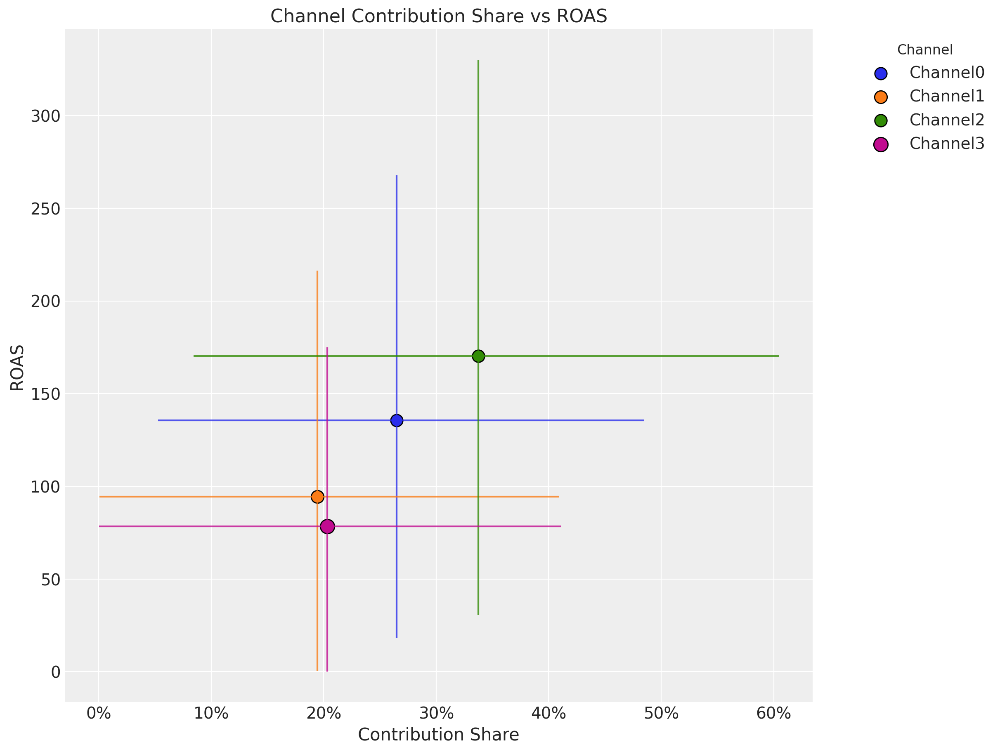

In [33]:
# Get the contribution share samples
share_samples = mmm.get_channel_contribution_share_samples()

fig, ax = plt.subplots(figsize=(12, 9))

for i, channel in enumerate(channels):
    # Contribution share mean and hdi
    share_mean = share_samples.sel(channel=channel).mean().to_numpy()
    share_hdi = az.hdi(share_samples.sel(channel=channel))["x"].to_numpy()

    # ROAS mean and hdi
    roas_mean = roas_samples.sel(channel=channel).mean().to_numpy()
    roas_hdi = az.hdi(roas_samples.sel(channel=channel))["x"].to_numpy()

    # Plot the contribution share hdi
    ax.vlines(share_mean, roas_hdi[0], roas_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the ROAS hdi
    ax.hlines(roas_mean, share_hdi[0], share_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the means
    ax.scatter(
        share_mean,
        roas_mean,
        # Size of the scatter points is proportional to the spend share
        s=5 * (spend_share[i] * 100),
        color=f"C{i}",
        edgecolor="black",
        label=channel,
    )
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))

ax.legend(
    bbox_to_anchor=(1.05, 1), loc="upper left", title="Channel", title_fontsize=12
)
ax.set(
    title="Channel Contribution Share vs ROAS",
    xlabel="Contribution Share",
    ylabel="ROAS",
);

### Out of sample predictions

In [34]:
rng = np.random.default_rng(seed=42)
y_pred_test = mmm.sample_posterior_predictive(
    X_test,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contribution"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Sampling: [y]


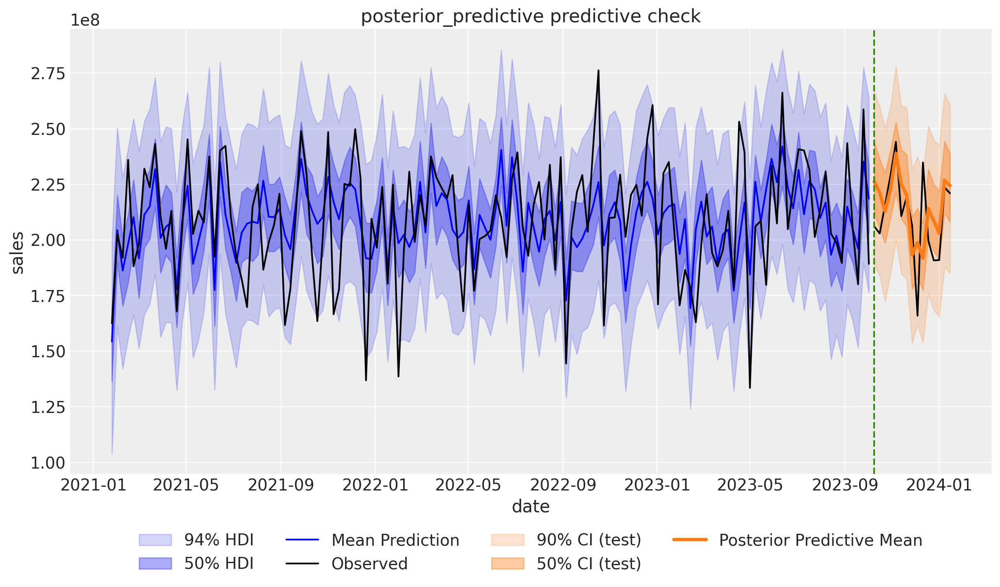

In [36]:
fig, ax = plt.subplots()
mmm.plot_posterior_predictive(original_scale=True, ax=ax)

test_hdi_90 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.90)
test_hdi_50 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.50)

ax.fill_between(
    X_test["time"],
    test_hdi_90[:, 0],
    test_hdi_90[:, 1],
    color="C1",
    label=f"{0.90:.0%} CI (test)",
    alpha=0.2,
)

ax.fill_between(
    X_test["time"],
    test_hdi_50[:, 0],
    test_hdi_50[:, 1],
    color="C1",
    label=f"{0.50:.0%} CI (test)",
    alpha=0.4,
)

ax.plot(X_test["time"], y_test, color="black")
ax.plot(
    X_test["time"],
    y_pred_test["y"].mean(dim="sample"),
    color="C1",
    linewidth=3,
    label="Posterior Predictive Mean",
)
ax.axvline(X_test["time"].iloc[0], color="C2", linestyle="--")
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(ylabel="sales");

(array([19645., 19662., 19676., 19692., 19706., 19723., 19737.]),
 [Text(19645.0, 0, '2023-10-15'),
  Text(19662.0, 0, '2023-11-01'),
  Text(19676.0, 0, '2023-11-15'),
  Text(19692.0, 0, '2023-12-01'),
  Text(19706.0, 0, '2023-12-15'),
  Text(19723.0, 0, '2024-01-01'),
  Text(19737.0, 0, '2024-01-15')])

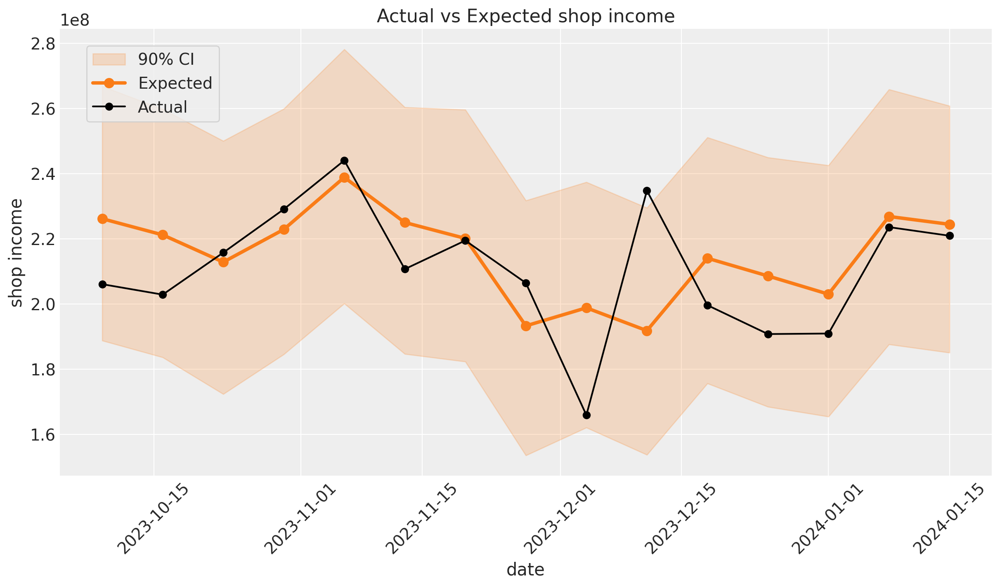

In [38]:
fig, ax = plt.subplots()
ax.fill_between(
    X_test["time"],
    test_hdi_90[:, 0],
    test_hdi_90[:, 1],
    color="C1",
    label=f"{0.90:.0%} CI",
    alpha=0.2,
)
ax.plot(
    X_test["time"],
    y_pred_test["y"].mean(dim="sample"),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Expected",
)
ax.plot(X_test["time"], y_test, marker="o", color="black", label="Actual")

# Move legend to left inside the plot
ax.legend(loc="upper left", bbox_to_anchor=(0.02, 0.98), ncol=1, frameon=True)
ax.set(title="Actual vs Expected shop income", xlabel="date", ylabel="shop income")
plt.xticks(rotation=45)


In [39]:
from sklearn.metrics import r2_score

def mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    y_true = y_true[mask]
    y_pred = y_pred[mask]
    if len(y_true) == 0:
        return np.nan
    return np.mean(np.abs((y_true - y_pred) / y_true))

# Get mean predictions for test set
y_pred_test_mean = y_pred_test["y"].mean(dim="sample").to_numpy()

# Calculate MAPE and R2
mape_test = mape(y_test, y_pred_test_mean)
r2_test = r2_score(y_test, y_pred_test_mean)

print("MAPE (test):", mape_test)
print("R2 (test):", r2_test)

MAPE (test): 0.0683328237602466
R2 (test): 0.11157664965090053


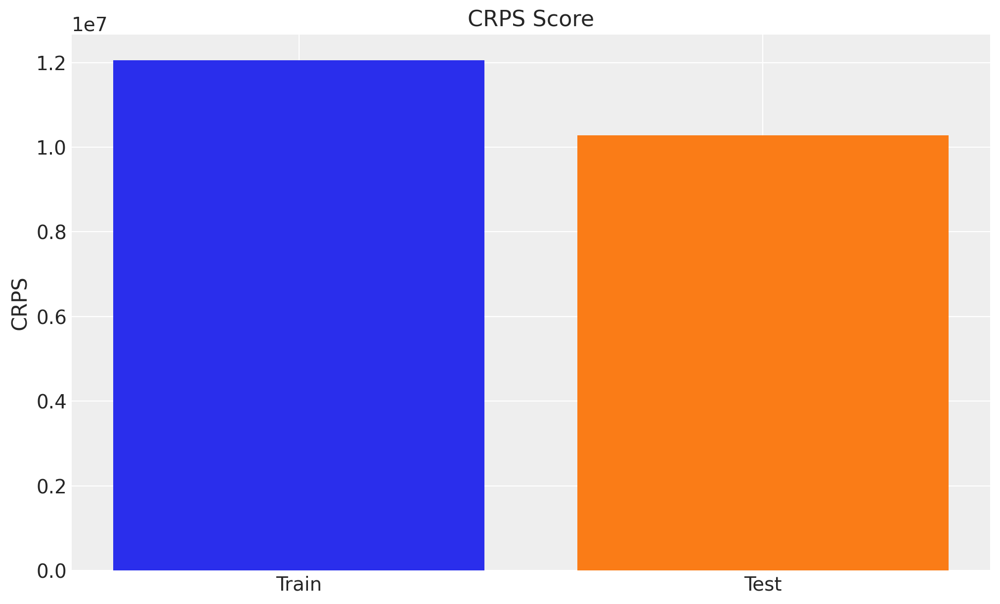

In [40]:
crps_train = crps(
    y_true=y_train.to_numpy(),
    y_pred=az.extract(mmm.idata["posterior_predictive"], var_names=["y"]).T,
)

crps_test = crps(y_true=y_test.to_numpy(), y_pred=y_pred_test["y"].T)

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(["Train", "Test"], [crps_train, crps_test], color=["C0", "C1"])
ax.set(ylabel="CRPS", title="CRPS Score");

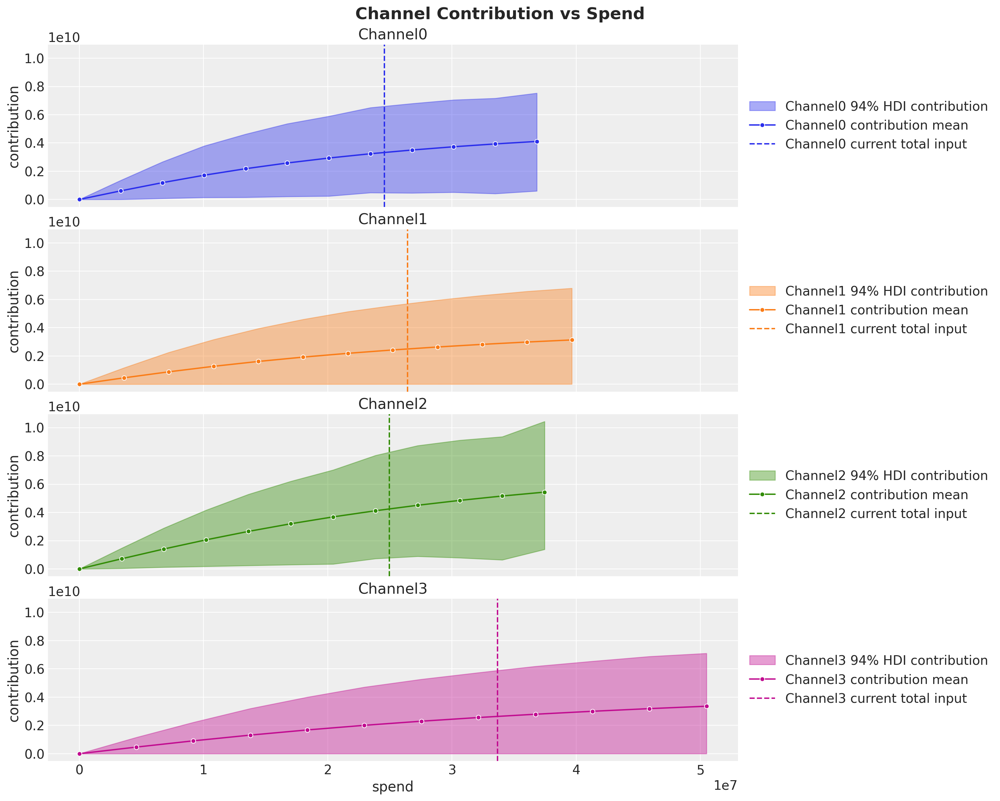

In [41]:
contributions = mmm.get_channel_contribution_forward_pass_grid(
    start=0, stop=1.5, num=12
)
share_grid = np.linspace(start=0, stop=1.5, num=12)
channel_columns = mmm.channel_columns
fig, axes = plt.subplots(
    nrows=len(channel_columns),
    ncols=1,
    figsize=(15, 3 * len(channel_columns)),
    sharex=True,
    sharey=True,
)

for i, channel in enumerate(channel_columns):
    ax = axes[i]

    channel_contribution_total = contributions.sel(channel=channel).sum(dim="date")

    hdi_prob = 0.94

    hdi_contribution = az.hdi(ary=channel_contribution_total, hdi_prob=hdi_prob).x

    total_channel_input = X_train[channel].sum()
    x_range = total_channel_input * share_grid

    ax.fill_between(
        x=x_range,
        y1=hdi_contribution[:, 0],
        y2=hdi_contribution[:, 1],
        color=f"C{i}",
        label=f"{channel} {hdi_prob:.0%} HDI contribution",
        alpha=0.4,
    )

    sns.lineplot(
        x=x_range,
        y=channel_contribution_total.mean(dim=("chain", "draw")),
        color=f"C{i}",
        marker="o",
        markersize=5,
        label=f"{channel} contribution mean",
        ax=ax,
    )

    ax.axvline(
        x=total_channel_input,
        color=f"C{i}",
        linestyle="--",
        label=f"{channel} current total input",
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=channel, xlabel="spend", ylabel="contribution")

fig.suptitle("Channel Contribution vs Spend", fontsize=18, fontweight="bold");

## Budget Optimization

In [42]:
X_test[channels].sum(axis=0)

Channel0    2602894.676
Channel1    2960937.896
Channel2    2778231.670
Channel3    3779379.840
dtype: float64

In [43]:
X_test[channels].sum().sum()

np.float64(12121444.082)

In [45]:
num_periods = X_test.shape[0]

# Total budget for the test set per channel
all_budget_per_channel = X_test[channels].sum()

# Total budget for the test set
all_budget = all_budget_per_channel.sum()

# Weekly budget for each channel
# We are assuming we do not know the total budget allocation in advance
# so this would be the naive "uniform" allocation.
weekly_budget = all_budget / num_periods

In [46]:
percentage_change = 0.5

mean_spend_per_period_test = X_test[channels].mean()

budget_bounds = {
    key: [(1 - percentage_change) * value, (1 + percentage_change) * value]
    for key, value in (mean_spend_per_period_test).to_dict().items()
}

In [121]:
print(budget_bounds)

{'Google-PMax': [58520.7238, 175562.1714], 'Google-Demand-Gen': [18676.523189999996, 56029.56956999999], 'YouTube': [3794.62652, 11383.87956], 'Meta-ASC': [2830.7483333333334, 8492.245], 'Meta-Reach': [6696.281, 20088.843], 'Meta-Performance': [2759.269666666666, 8277.808999999997], 'TV': [6356.033666666667, 19068.101000000002], 'Microsoft': [2276.4286666666667, 6829.286], 'Pinterest': [2695.1053333333334, 8085.316000000001]}


In [47]:
model_granularity = "weekly"
allocation_strategy, optimization_result = mmm.optimize_budget(
    budget=weekly_budget,
    num_periods=num_periods,
    budget_bounds=budget_bounds,
    minimize_kwargs={
        "method": "SLSQP",
        "options": {"ftol": 1e-6, "maxiter": 1_000, "finite_diff_rel_step": 0.01},
    },
)

/tmp/ipykernel_25892/2866836614.py:2: DeprecationWarning: This method is deprecated and will be removed in a future version. Please migrate to the `Multidimensal.MMM` class.
  allocation_strategy, optimization_result = mmm.optimize_budget(
/root/PyMC-Marketing-Demo/.venv/lib/python3.12/site-packages/pymc_marketing/mmm/budget_optimizer.py:745: UserWarning: Using default equality constraint
  self.set_constraints(


In [48]:
optimization_result

     message: Optimization terminated successfully
     success: True
      status: 0
         fun: -1.9967016422479977e-05
           x: [ 2.020e+05  2.020e+05  2.020e+05  2.020e+05]
         nit: 1
         jac: [-3.111e-11 -2.163e-11 -3.272e-11 -1.338e-11]
        nfev: 1
        njev: 1
 multipliers: [-2.471e-11]

In [49]:
print(f"Success: {optimization_result.success}")
print(f"Message: {optimization_result.message}")
print(f"Iterations: {optimization_result.nit}")

Success: True
Message: Optimization terminated successfully
Iterations: 1


In [51]:
from pymc_marketing.mmm.budget_optimizer import BudgetOptimizer

allocator =BudgetOptimizer(model=mmm, num_periods=num_periods)

# Step 2: Get the original objective function
original_objective = allocator._compiled_functions[allocator.utility_function]["objective_and_grad"]

# Step 3: Create scaled wrapper
SCALE_FACTOR = 1e8

def scaled_objective_and_grad(x):
    obj, grad = original_objective(x)
    return obj * SCALE_FACTOR, grad * SCALE_FACTOR

# Step 4: Replace the compiled function
allocator._compiled_functions[allocator.utility_function]["objective_and_grad"] = scaled_objective_and_grad

# Step 5: Run optimization with the scaled objective
allocation_strategy, optimization_result = allocator.allocate_budget(
    total_budget=weekly_budget,
    budget_bounds=budget_bounds,
    minimize_kwargs={
        "method": "SLSQP",
        "options": {
            "maxiter": 10000,
            "disp": True
        }
    }
)

/root/PyMC-Marketing-Demo/.venv/lib/python3.12/site-packages/pymc_marketing/mmm/budget_optimizer.py:745: UserWarning: Using default equality constraint
  self.set_constraints(


Optimization terminated successfully    (Exit mode 0)
            Current function value: -2198.667574359922
            Iterations: 36
            Function evaluations: 36
            Gradient evaluations: 36


In [52]:
allocation_strategy

<xarray.DataArray (channel: 4)> Size: 32B
array([260289.4676    , 144004.30953326, 277823.167     , 125979.328     ])
Coordinates:
  * channel  (channel) <U8 128B 'Channel0' 'Channel1' 'Channel2' 'Channel3'

In [53]:
X_test[channels].mean()

Channel0    173526.311733
Channel1    197395.859733
Channel2    185215.444667
Channel3    251958.656000
dtype: float64

In [55]:
allocation_strategy.values.sum() * num_periods

np.float64(12121444.081998851)

In [56]:
X_test[channels].sum().sum()

np.float64(12121444.082)

In [57]:
baseline_allocation = (
    X_test[channels].mean()
).to_dict()

response_initial = mmm.sample_response_distribution(
    allocation_strategy=baseline_allocation,
    time_granularity=model_granularity,
    num_periods=num_periods,
    noise_level=0.05,
)


In [63]:
response_initial["channel_contribution"].sum(dim="date")

<xarray.DataArray 'channel_contribution' (channel: 4, sample: 4000)> Size: 128kB
array([[3.45374977, 1.22581241, 1.88286488, ..., 1.14513857, 1.41587376,
        0.64821879],
       [0.85933599, 0.81353731, 0.20564982, ..., 0.72910042, 0.806874  ,
        1.35093572],
       [1.83339651, 2.59848338, 2.12614791, ..., 1.52067616, 0.83743252,
        2.98583594],
       [2.03476286, 1.41562671, 0.83056963, ..., 1.22102327, 0.64573363,
        0.97957299]], shape=(4, 4000))
Coordinates:
  * channel  (channel) <U8 128B 'Channel0' 'Channel1' 'Channel2' 'Channel3'
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999

In [58]:

response_initial_contribution_original_scale = apply_sklearn_transformer_across_dim(
    data=response_initial["channel_contribution"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

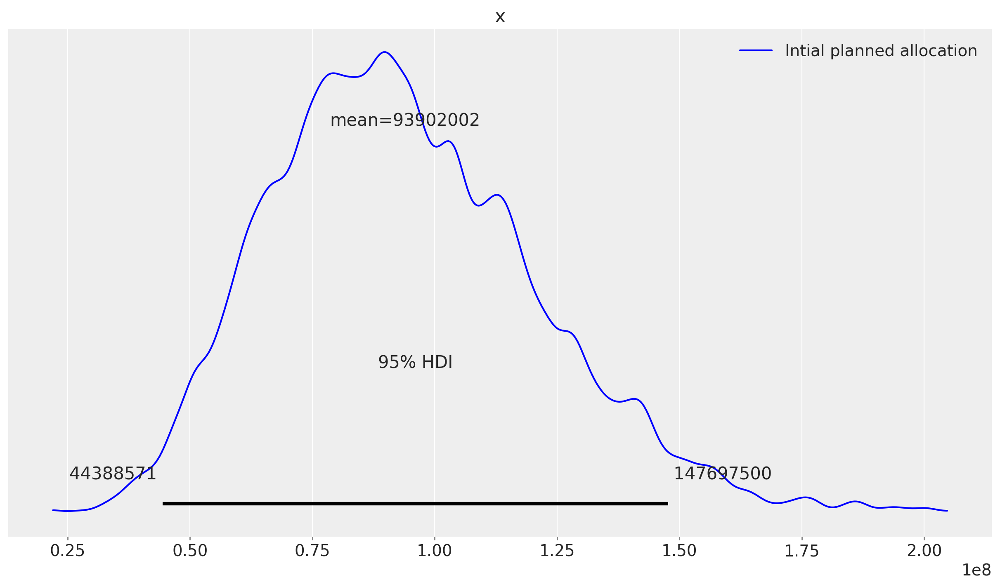

In [59]:
fig, ax = plt.subplots()
az.plot_posterior(
    response_initial_contribution_original_scale.values.flatten(),
    hdi_prob=0.95,
    color="blue",
    label="Intial planned allocation",
    ax=ax,
);

In [64]:
response = mmm.sample_response_distribution(
    allocation_strategy=allocation_strategy,
    time_granularity=model_granularity,
    num_periods=num_periods,
    noise_level=0.05,
)

In [65]:
response_channel_contribution_original_scale = apply_sklearn_transformer_across_dim(
    data=response["channel_contribution"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

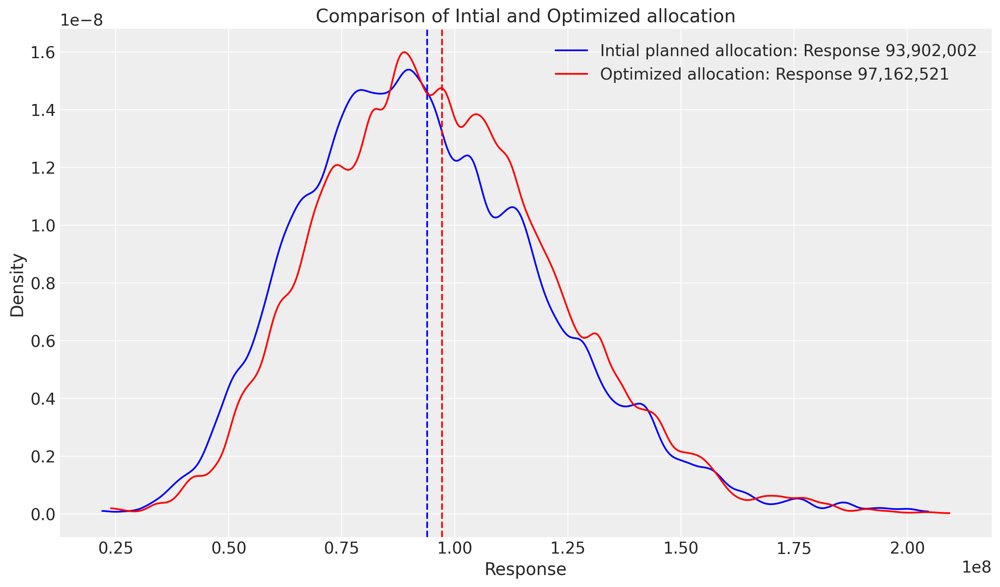

In [66]:
fig, ax = plt.subplots()

# Initial planned allocation
initial_data = response_initial_contribution_original_scale.values.flatten()
initial_mean = initial_data.mean()
az.plot_dist(
    initial_data,
    # hdi_prob=0.75,
    color="blue",
    label=f"Intial planned allocation: Response {initial_mean:,.0f}",
    ax=ax,
    # kind="hist",
)
ax.axvline(initial_mean, color="blue", linestyle="--")

# Optimized allocation
optimized_data = response_channel_contribution_original_scale.values.flatten()
optimized_mean = optimized_data.mean()
az.plot_dist(
    optimized_data,
    # hdi_prob=0.75,
    color="red",
    label=f"Optimized allocation: Response {optimized_mean:,.0f}",
    ax=ax,
    # kind="hist",
)
ax.axvline(optimized_mean, color="red", linestyle="--")

ax.set_title("Comparison of Intial and Optimized allocation")
ax.set_xlabel("Response")
ax.set_ylabel("Density")
ax.legend()

plt.show()

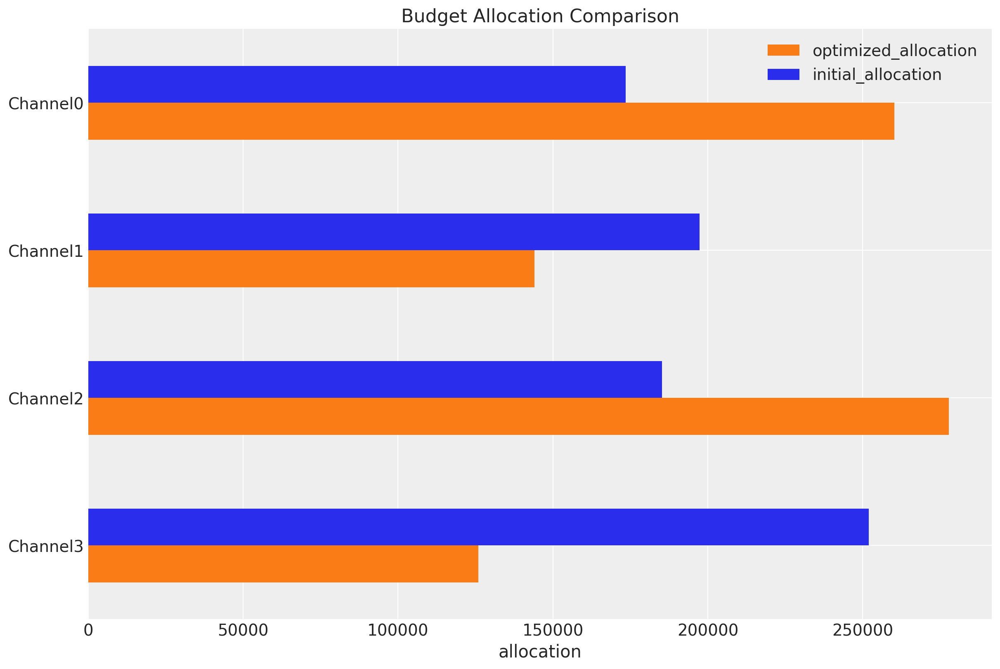

In [67]:
fig, ax = plt.subplots()

(
    pd.Series(allocation_strategy, index=mean_spend_per_period_test.index)
    .to_frame(name="optimized_allocation")
    .join(mean_spend_per_period_test.to_frame(name="initial_allocation"))
    .sort_index(ascending=False)
    .plot.barh(figsize=(12, 8), color=["C1", "C0"], ax=ax)
)
ax.set(title="Budget Allocation Comparison", xlabel="allocation");

In [68]:
np.testing.assert_allclose(
    mean_spend_per_period_test.sum(), allocation_strategy.sum().item()
)

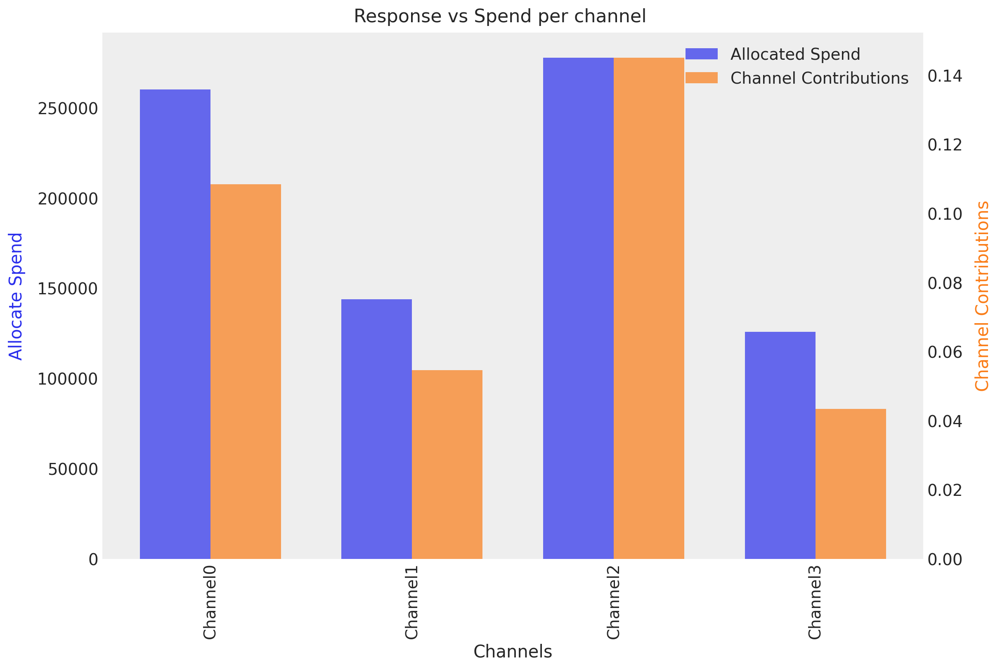

In [69]:
fig, ax = mmm.plot_budget_allocation(samples=response, figsize=(12, 8))
fig.suptitle("Response vs Spend per channel", fontsize=16);

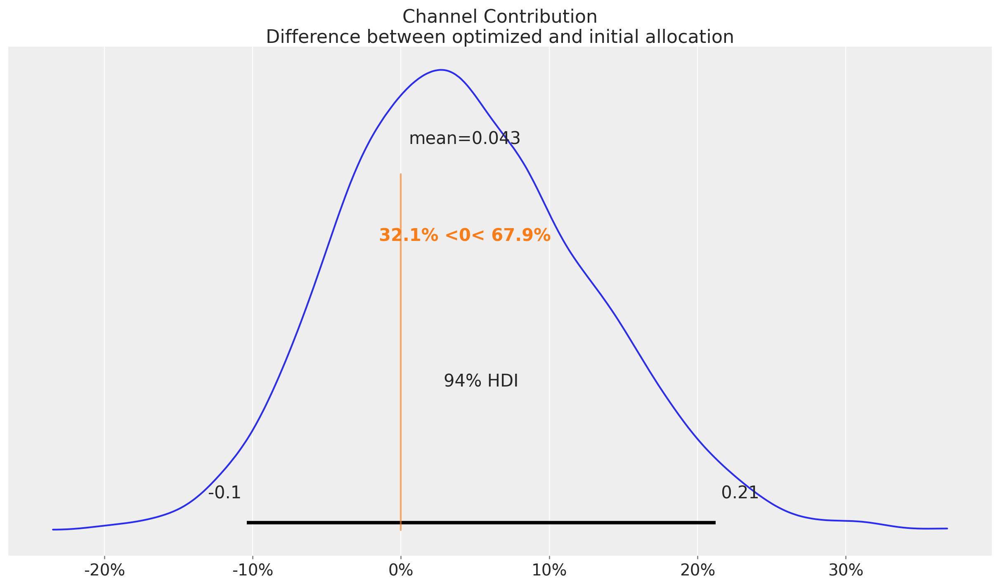

In [70]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        response_channel_contribution_original_scale.sum(dim="date")
        - response_initial_contribution_original_scale.sum(dim="date")
    )
    / response_initial_contribution_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(
    title="Channel Contribution\nDifference between optimized and initial allocation"
);

Optimization according to pymc

In [122]:
channel_columns = mmm.channel_columns
control_columns = mmm.control_columns
rng = np.random.default_rng(seed=123)

X_actual_uniform = X_test.copy()

for channel in channel_columns:
    X_actual_uniform[channel] = mean_spend_per_period_test[channel]

for control in control_columns:
    X_actual_uniform[control] = 0.0

pred_test_uniform = mmm.sample_posterior_predictive(
    X_actual_uniform,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contribution"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Sampling: [y]


In [123]:
response_initial_pymc = apply_sklearn_transformer_across_dim(
    data=pred_test_uniform["channel_contribution"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

In [124]:
response_channel_contribution_original_scale = apply_sklearn_transformer_across_dim(
    data=response["channel_contribution"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

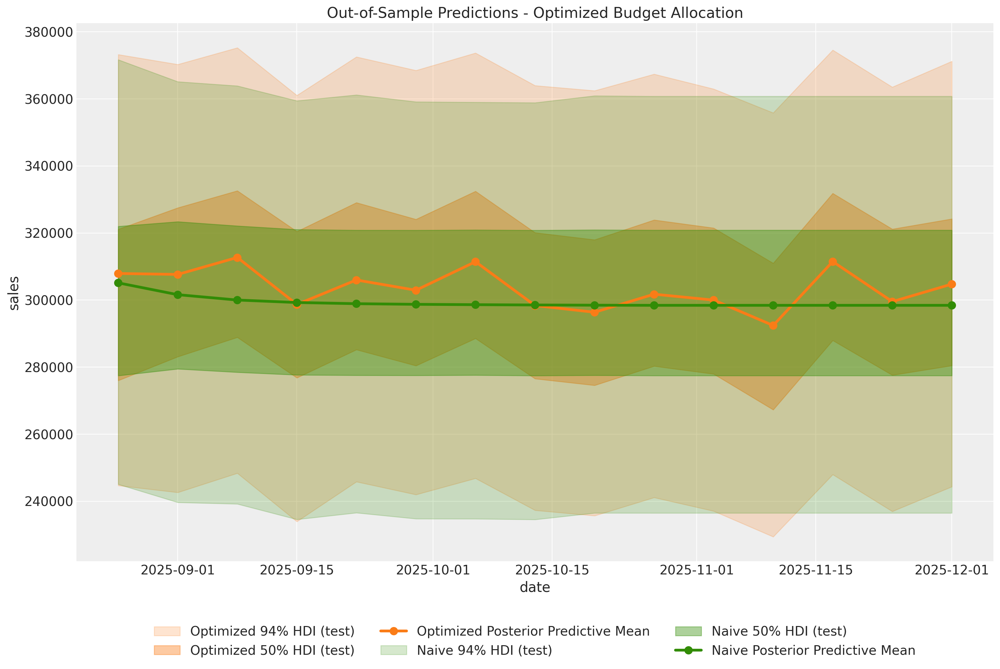

In [127]:
date_column = mmm.date_column

fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    response_channel_contribution_original_scale,
    hdi_prob=0.94,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    response_channel_contribution_original_scale,
    hdi_prob=0.5,
    color="C1",
    fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    response_channel_contribution_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized Posterior Predictive Mean",
)

az.plot_hdi(
    X_actual_uniform[date_column],
    response_initial_pymc,
    hdi_prob=0.94,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Naive {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_actual_uniform[date_column],
    response_initial_pymc,
    hdi_prob=0.5,
    color="C2",
    fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_actual_uniform[date_column],
    response_initial_pymc.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Naive Posterior Predictive Mean",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
);

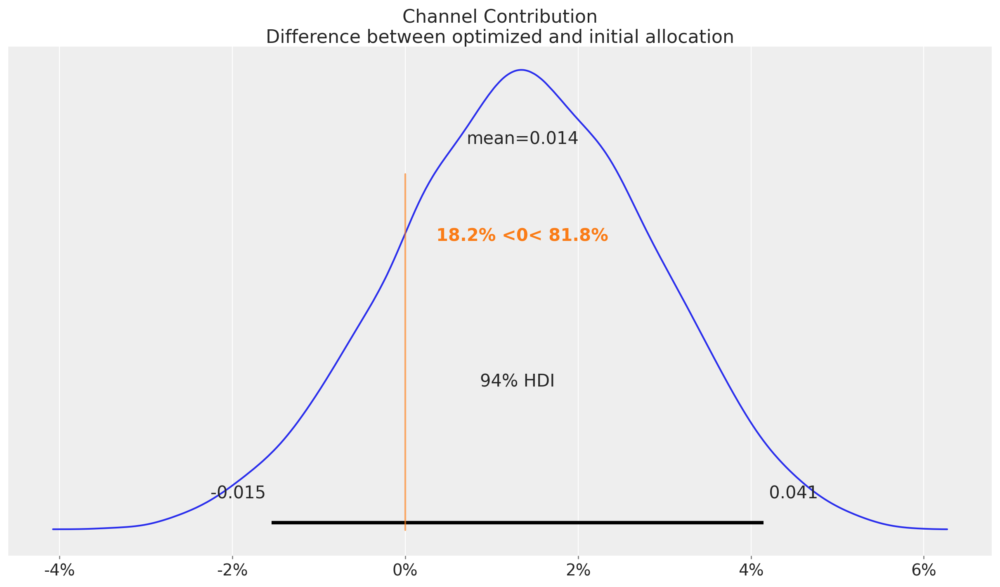

In [131]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        response_channel_contribution_original_scale.sum(dim="date")
        - response_initial_pymc
        .sum(dim="date")
    )
    / response_channel_contribution_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(
    title="Channel Contribution\nDifference between optimized and initial allocation"
);

### Sales comparison

In [71]:

y_response_initial = apply_sklearn_transformer_across_dim(
    data=response_initial["y"]
    .unstack()
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

In [72]:

y_response_optimized = apply_sklearn_transformer_across_dim(
    data=response["y"]
    .unstack()
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

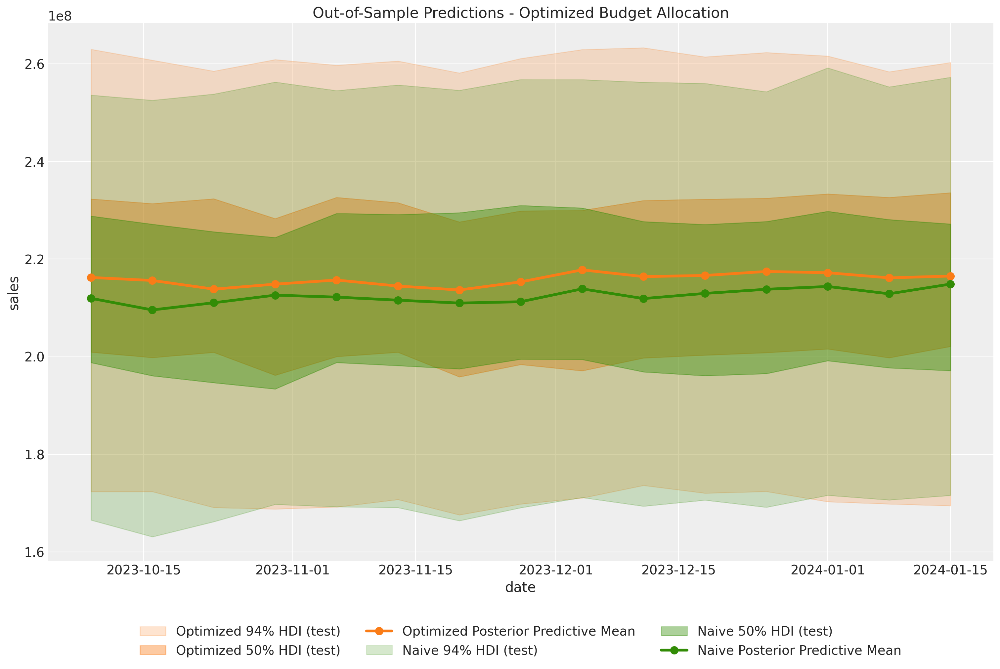

In [73]:
date_column = mmm.date_column

fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    y_response_optimized,
    hdi_prob=0.94,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    y_response_optimized,
    hdi_prob=0.5,
    color="C1",
    fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    y_response_optimized.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized Posterior Predictive Mean",
)

az.plot_hdi(
    X_test[date_column],
    y_response_initial,
    hdi_prob=0.94,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Naive {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    y_response_initial,
    hdi_prob=0.5,
    color="C2",
    fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    y_response_initial.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Naive Posterior Predictive Mean",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
);

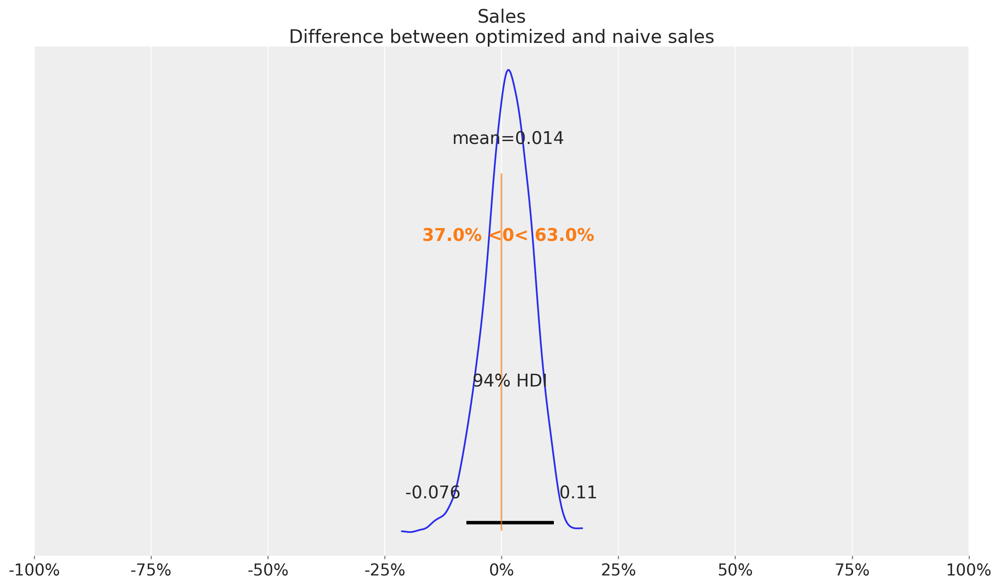

In [74]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        y_response_optimized.sum(dim="date")
        - y_response_initial.sum(dim="date")
    )
    / y_response_optimized.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(title="Sales\nDifference between optimized and naive sales", xlim=(-1, 1));

## Save and load model

In [17]:
# Save the model
mmm.save("demo.nc")

In [ ]:
# Load the model
mmm= MMM.load("demo.nc")